In [20]:
"""
This notebook contains code for drawing face-detected and random samples from a video, 
annotating on face/no face, and calculating precision, recall, and F-score.
"""

import pandas as pd
import cv2
import os
import ntpath
import numpy as np
import matplotlib.pyplot as plt

In [8]:
%matplotlib inline

In [40]:
def format_num(num):
    """converts int num to string, and adds zeros to get to length 5, if necessary."""
    num = str(num)
    return '0' * (5 - len(num)) + num          

def save_frames(row, frame_dir, out_dir):
    """ for each face-detected frame, saves the bounding box as an image """                             
    frame_num = format_num(row['frame'])                                                                    
    img = cv2.imread(os.path.join(frame_dir, 'image-{}.jpg'.format(frame_num)))
    cv2.imwrite(os.path.join(out_dir, 'image-{}.jpg'.format(frame_num)), img)

def sample_frames(frame_dir, out_dir, csv_path, only_face=False, num_frames=100):
    """
    sample frames from frame_dir and csv_path into frames and csv in the out_dir
    samples only face-detected frames if only_face is set to True.
    """

    if not os.path.exists(out_dir):
            os.makedirs(out_dir)

    #df = pd.read_csv(csv_path,header=None)#??
    df = pd.read_csv(csv_path)
    df.rename(columns = {df.columns[0]: 'name',
                       df.columns[1]: 'frame',
                       df.columns[2]: 'face_detected',
                       df.columns[3]: 'x1',
                       df.columns[4]: 'y1',
                       df.columns[5]: 'x2',
                       df.columns[6]: 'y2'}, inplace=True)

    if only_face:
        df = df[df['face_detected'] == True]
    df = df.reset_index(drop = True)
    df = df.sample(sample_size)
    df.apply(lambda row: save_frames(row, frame_dir, out_dir), axis = 1)
    df.to_csv(out_dir)

In [41]:
def get_annotation_input():
    """respond 'y' for face, 'n' or '' for no face, 
    'g' to go back and re-annotate prev frame"""
    annot = input('Face? (y/[n]/g[o back]) ').lower()
    while annot not in ['y', 'n', '', 'g']:
        annot = input('Invalid input.\nFace? (y/[n]/g[o back])').lower()
    print('Recorded \'{}\''.format(annot))
    return annot
    

def annotate_frames(sample_frame_dir, sample_csv_path):
    """Interface for quick annotation of face/no face in sample_frame_dir.
    Saves info as 'ground_truth' column in sample frames CSV."""
    df = pd.read_csv(sample_csv_path) # assumes a header is already present.
    df = df.reset_index()
    df['face_present'] = True
    frame_nums = [format_num(x) for x in df['frame']]
    df = df.set_index('frame')
    
    i = 0
    while i < len(frame_nums):
        print('\nImage {0}/{1}'.format(i + 1, len(frame_nums)))
        img_name = 'image-{}.jpg'.format(frame_nums[i])
        img = plt.imread(os.path.join(sample_frame_dir, img_name))
        plt.imshow(img)
        plt.show()
        annot = get_annotation_input()
        if annot == 'g':
            print('Going back to previous frame')
            i -= 1
        else:
            df.at[int(frame_nums[i]), 'face_present'] = (annot == 'y')
            i += 1
    
    print('Saving annotated df')
    df = df.reset_index()         
    df.to_csv(sample_csv_path)
    print('Length of annotated df: {}'.format(len(df)))


Image 1/98


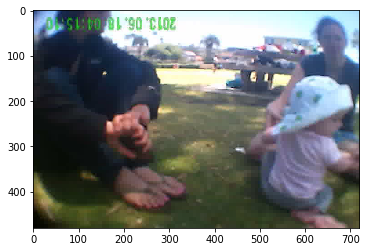

Face? (y/[n]/g[o back]) 
Recorded ''

Image 2/98


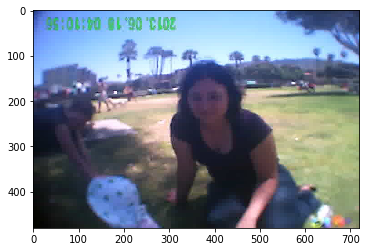

Face? (y/[n]/g[o back]) 
Recorded ''

Image 3/98


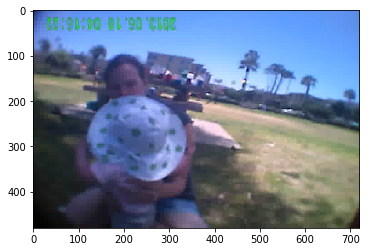

Face? (y/[n]/g[o back]) 
Recorded ''

Image 4/98


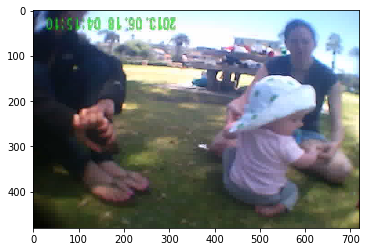

Face? (y/[n]/g[o back]) 
Recorded ''

Image 5/98


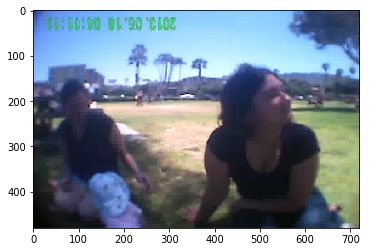

Face? (y/[n]/g[o back]) 
Recorded ''

Image 6/98


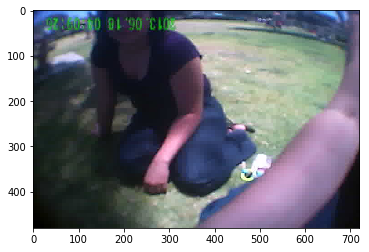

Face? (y/[n]/g[o back]) 
Recorded ''

Image 7/98


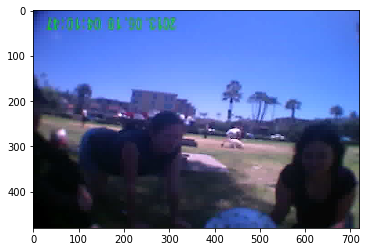

Face? (y/[n]/g[o back]) 
Recorded ''

Image 8/98


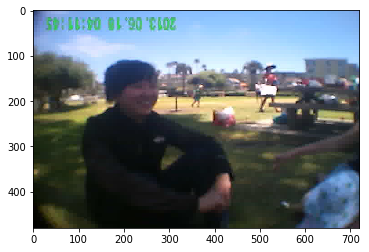

Face? (y/[n]/g[o back]) 
Recorded ''

Image 9/98


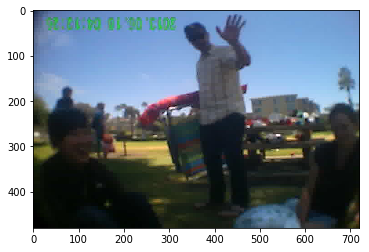

Face? (y/[n]/g[o back]) 
Recorded ''

Image 10/98


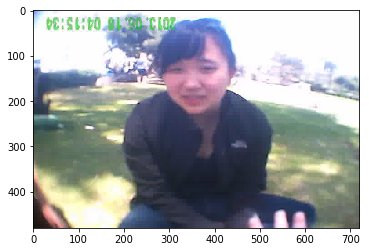

Face? (y/[n]/g[o back]) 
Recorded ''

Image 11/98


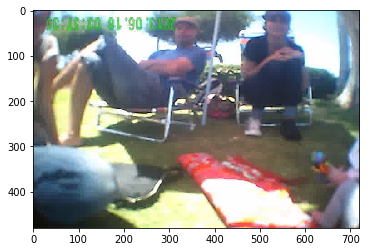

Face? (y/[n]/g[o back]) 
Recorded ''

Image 12/98


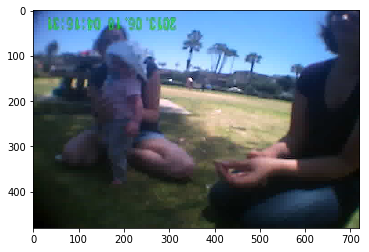

Face? (y/[n]/g[o back]) 
Recorded ''

Image 13/98


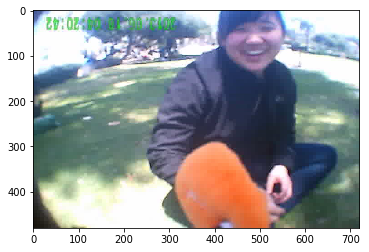

Face? (y/[n]/g[o back]) 
Recorded ''

Image 14/98


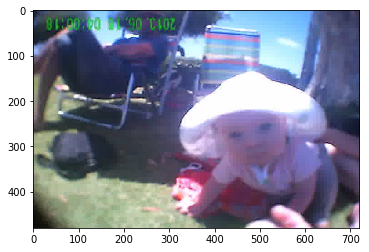

Face? (y/[n]/g[o back]) 
Recorded ''

Image 15/98


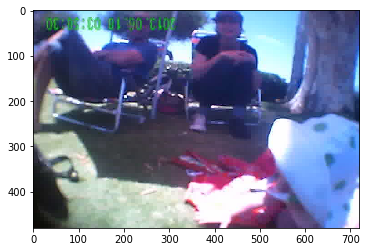

Face? (y/[n]/g[o back]) 
Recorded ''

Image 16/98


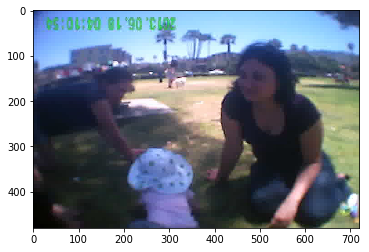

Face? (y/[n]/g[o back]) 
Recorded ''

Image 17/98


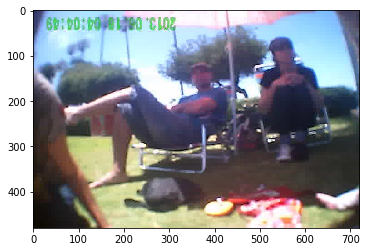

Face? (y/[n]/g[o back]) 
Recorded ''

Image 18/98


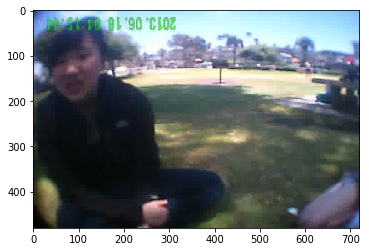

Face? (y/[n]/g[o back]) 
Recorded ''

Image 19/98


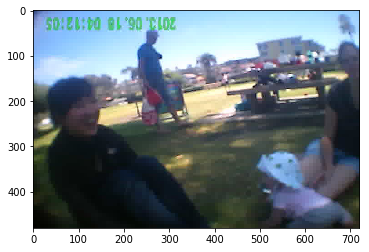

Face? (y/[n]/g[o back]) 
Recorded ''

Image 20/98


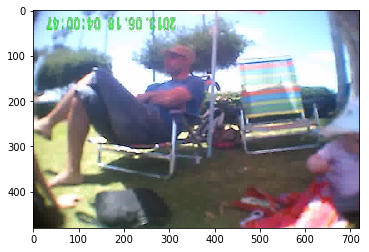

Face? (y/[n]/g[o back]) 
Recorded ''

Image 21/98


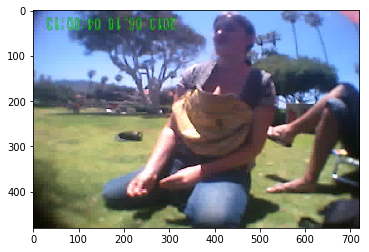

Face? (y/[n]/g[o back]) 
Recorded ''

Image 22/98


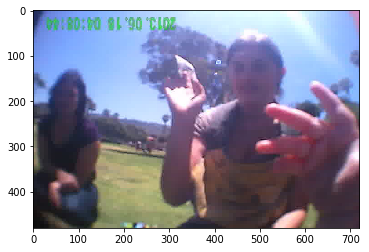

Face? (y/[n]/g[o back]) 
Recorded ''

Image 23/98


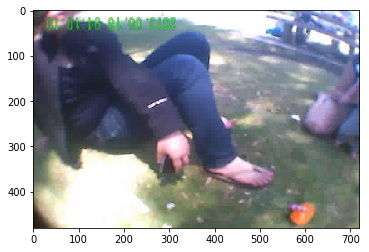

Face? (y/[n]/g[o back]) 
Recorded ''

Image 24/98


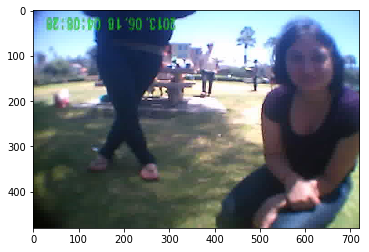

Face? (y/[n]/g[o back]) 
Recorded ''

Image 25/98


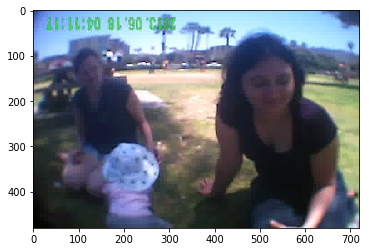

Face? (y/[n]/g[o back]) 
Recorded ''

Image 26/98


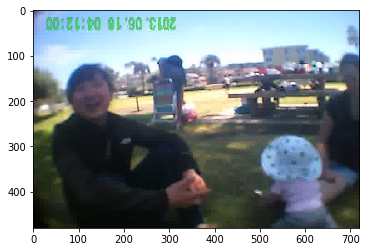

Face? (y/[n]/g[o back]) 
Recorded ''

Image 27/98


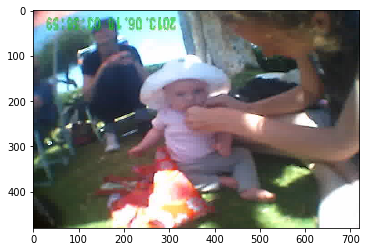

Face? (y/[n]/g[o back]) 
Recorded ''

Image 28/98


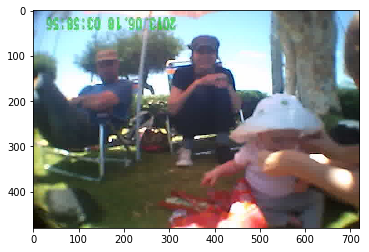

Face? (y/[n]/g[o back]) 
Recorded ''

Image 29/98


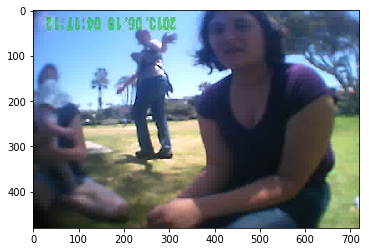

Face? (y/[n]/g[o back]) 
Recorded ''

Image 30/98


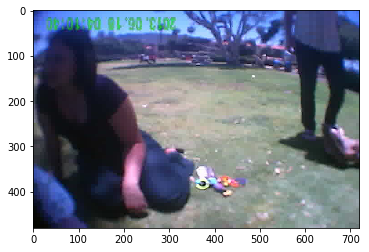

Face? (y/[n]/g[o back]) 
Recorded ''

Image 31/98


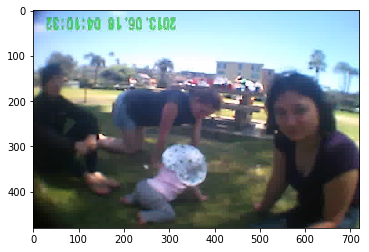

Face? (y/[n]/g[o back]) 
Recorded ''

Image 32/98


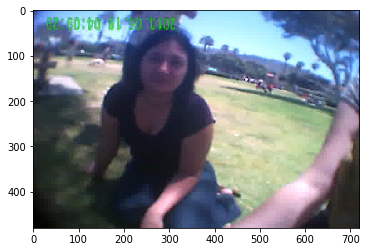

Face? (y/[n]/g[o back]) 
Recorded ''

Image 33/98


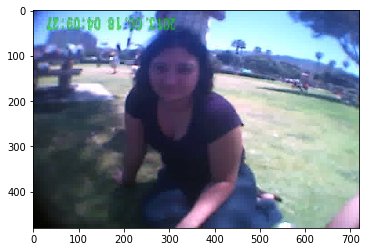

Face? (y/[n]/g[o back]) 
Recorded ''

Image 34/98


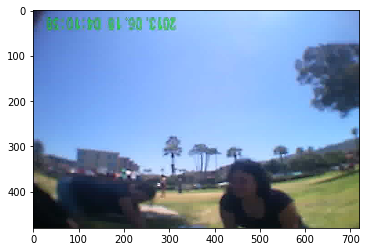

Face? (y/[n]/g[o back]) 
Recorded ''

Image 35/98


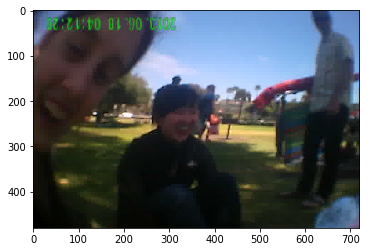

Face? (y/[n]/g[o back]) 
Recorded ''

Image 36/98


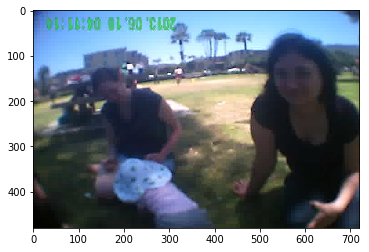

Face? (y/[n]/g[o back]) 
Recorded ''

Image 37/98


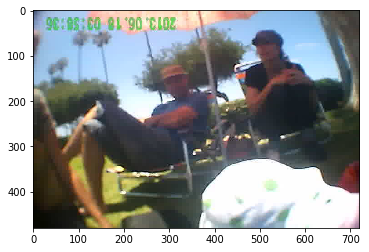

Face? (y/[n]/g[o back]) 
Recorded ''

Image 38/98


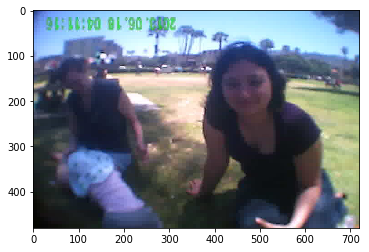

Face? (y/[n]/g[o back]) 
Recorded ''

Image 39/98


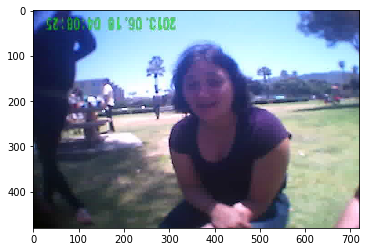

Face? (y/[n]/g[o back]) 
Recorded ''

Image 40/98


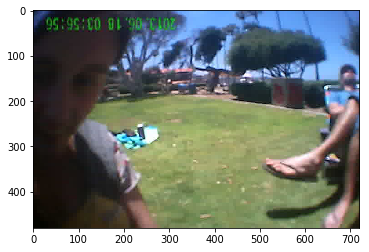

Face? (y/[n]/g[o back]) 
Recorded ''

Image 41/98


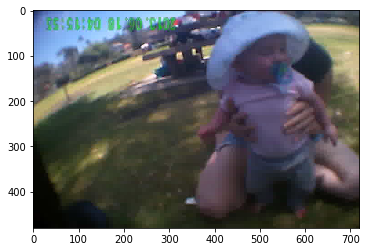

Face? (y/[n]/g[o back]) 
Recorded ''

Image 42/98


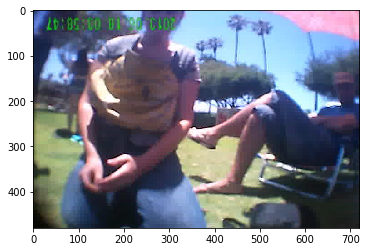

Face? (y/[n]/g[o back]) 
Recorded ''

Image 43/98


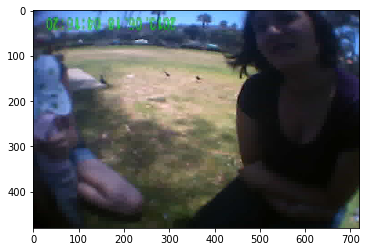

Face? (y/[n]/g[o back]) 
Recorded ''

Image 44/98


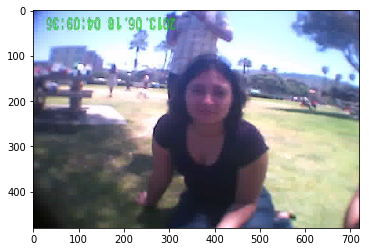

Face? (y/[n]/g[o back]) 
Recorded ''

Image 45/98


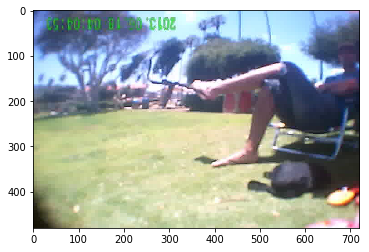

Face? (y/[n]/g[o back]) 
Recorded ''

Image 46/98


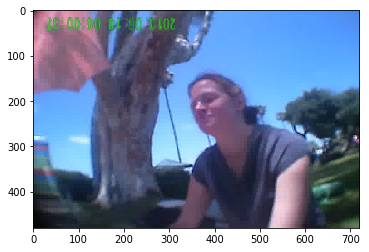

Face? (y/[n]/g[o back]) 
Recorded ''

Image 47/98


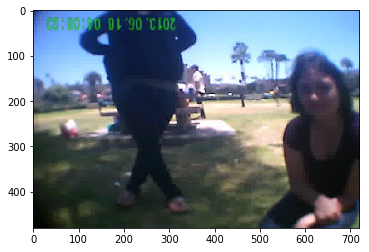

Face? (y/[n]/g[o back]) 
Recorded ''

Image 48/98


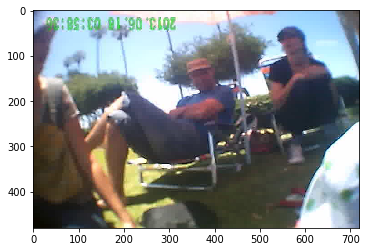

Face? (y/[n]/g[o back]) 
Recorded ''

Image 49/98


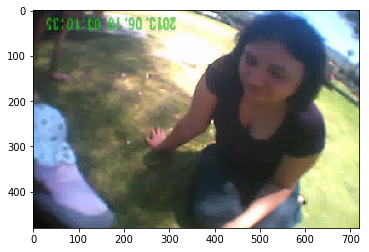

Face? (y/[n]/g[o back]) 
Recorded ''

Image 50/98


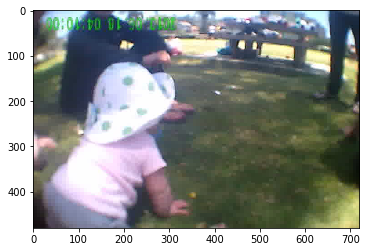

Face? (y/[n]/g[o back]) 
Recorded ''

Image 51/98


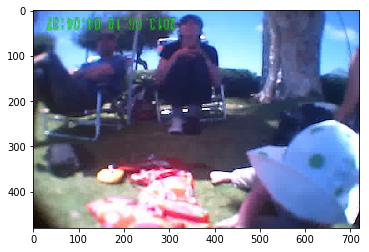

Face? (y/[n]/g[o back]) 
Recorded ''

Image 52/98


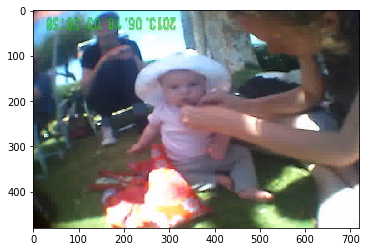

Face? (y/[n]/g[o back]) 
Recorded ''

Image 53/98


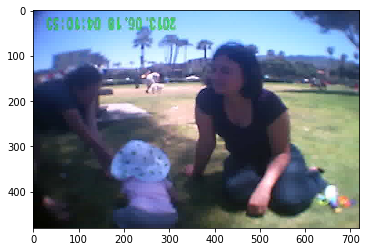

Face? (y/[n]/g[o back]) 
Recorded ''

Image 54/98


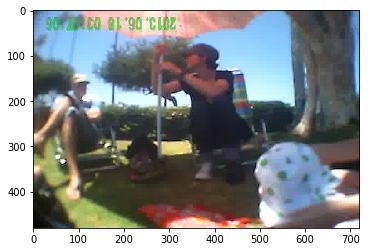

Face? (y/[n]/g[o back]) 
Recorded ''

Image 55/98


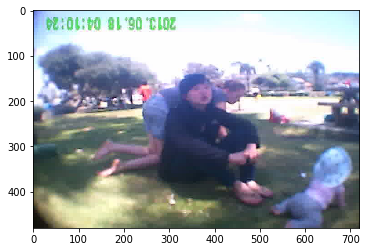

Face? (y/[n]/g[o back]) 
Recorded ''

Image 56/98


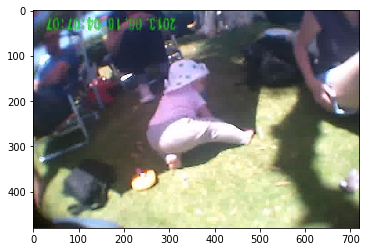

Face? (y/[n]/g[o back]) 
Recorded ''

Image 57/98


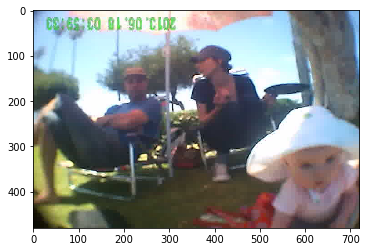

Face? (y/[n]/g[o back]) 
Recorded ''

Image 58/98


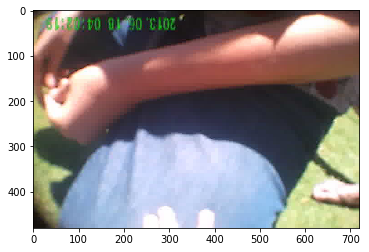

Face? (y/[n]/g[o back]) 
Recorded ''

Image 59/98


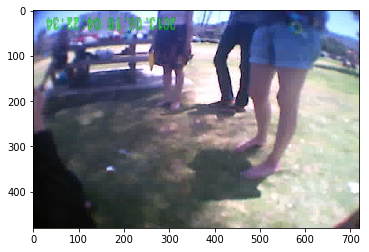

Face? (y/[n]/g[o back]) 
Recorded ''

Image 60/98


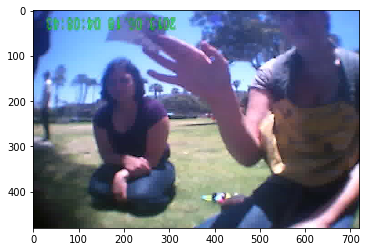

Face? (y/[n]/g[o back]) 
Recorded ''

Image 61/98


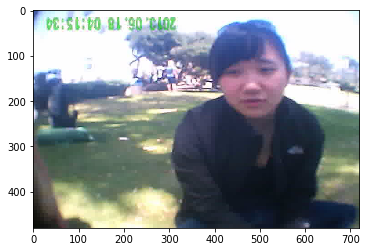

Face? (y/[n]/g[o back]) 
Recorded ''

Image 62/98


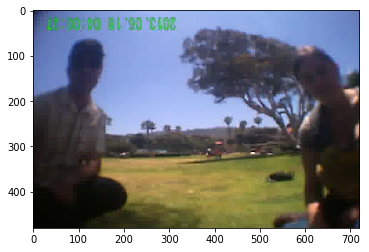

Face? (y/[n]/g[o back]) 
Recorded ''

Image 63/98


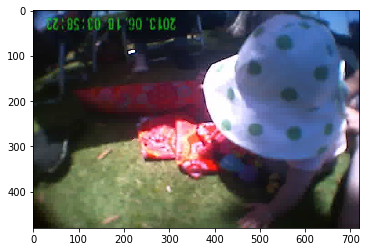

Face? (y/[n]/g[o back]) 
Recorded ''

Image 64/98


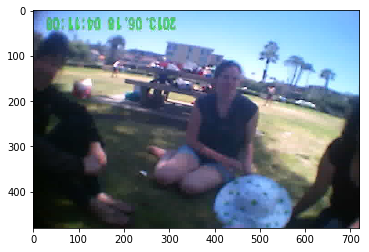

Face? (y/[n]/g[o back]) 
Recorded ''

Image 65/98


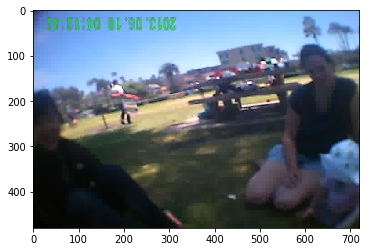

Face? (y/[n]/g[o back]) 
Recorded ''

Image 66/98


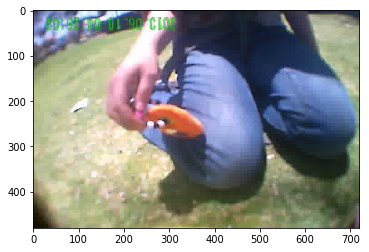

Face? (y/[n]/g[o back]) 
Recorded ''

Image 67/98


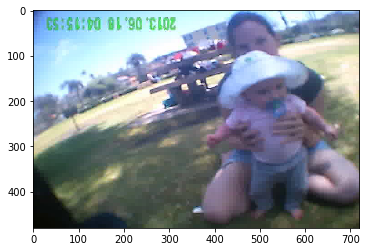

Face? (y/[n]/g[o back]) 
Recorded ''

Image 68/98


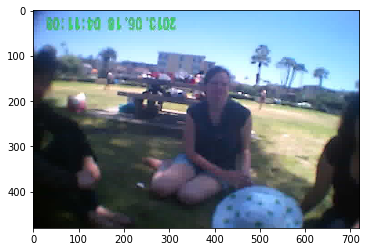

Face? (y/[n]/g[o back]) 
Recorded ''

Image 69/98


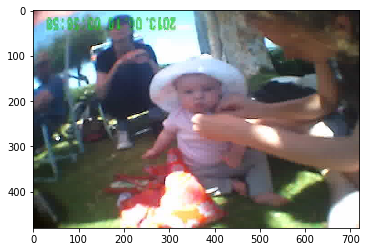

Face? (y/[n]/g[o back]) 
Recorded ''

Image 70/98


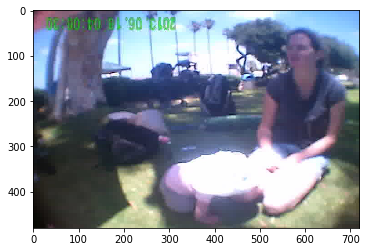

Face? (y/[n]/g[o back]) 
Recorded ''

Image 71/98


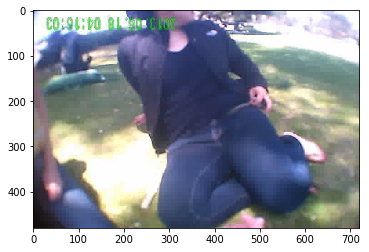

Face? (y/[n]/g[o back]) 
Recorded ''

Image 72/98


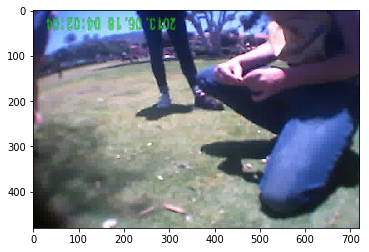

Face? (y/[n]/g[o back]) 
Recorded ''

Image 73/98


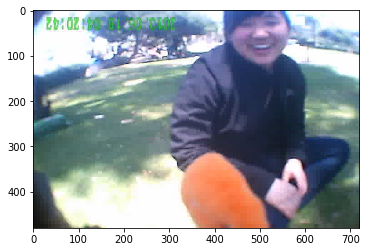

Face? (y/[n]/g[o back]) 
Recorded ''

Image 74/98


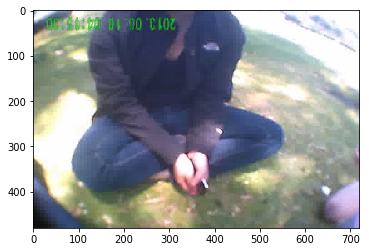

Face? (y/[n]/g[o back]) 
Recorded ''

Image 75/98


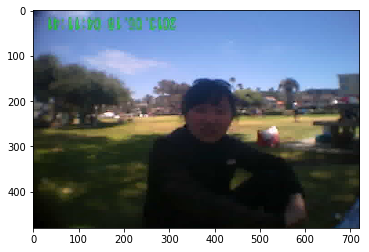

Face? (y/[n]/g[o back]) 
Recorded ''

Image 76/98


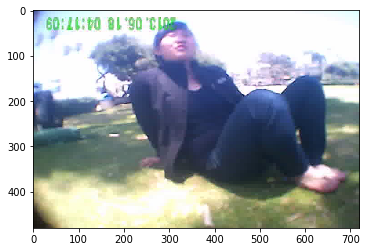

Face? (y/[n]/g[o back]) 
Recorded ''

Image 77/98


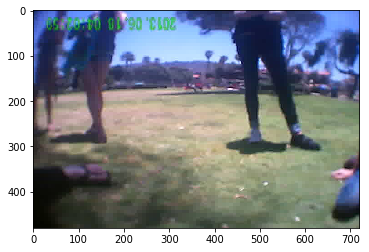

Face? (y/[n]/g[o back]) 
Recorded ''

Image 78/98


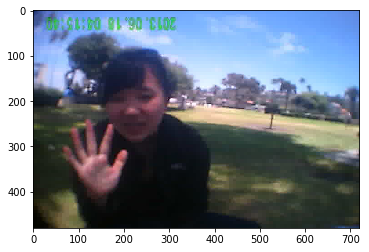

Face? (y/[n]/g[o back]) 
Recorded ''

Image 79/98


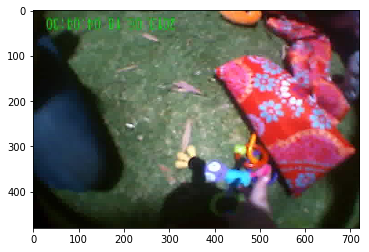

Face? (y/[n]/g[o back]) 
Recorded ''

Image 80/98


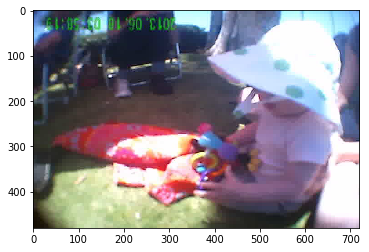

Face? (y/[n]/g[o back]) 
Recorded ''

Image 81/98


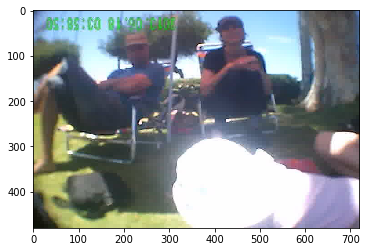

Face? (y/[n]/g[o back]) 
Recorded ''

Image 82/98


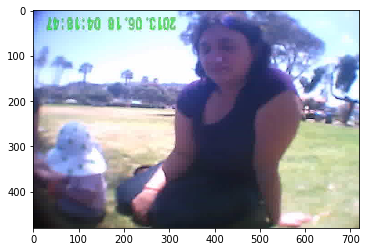

Face? (y/[n]/g[o back]) 
Recorded ''

Image 83/98


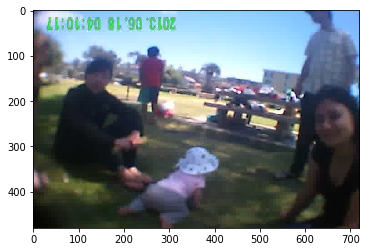

Face? (y/[n]/g[o back]) 
Recorded ''

Image 84/98


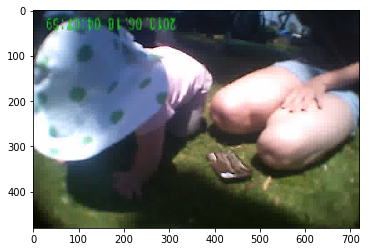

Face? (y/[n]/g[o back]) 
Recorded ''

Image 85/98


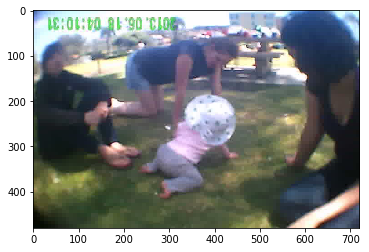

Face? (y/[n]/g[o back]) 
Recorded ''

Image 86/98


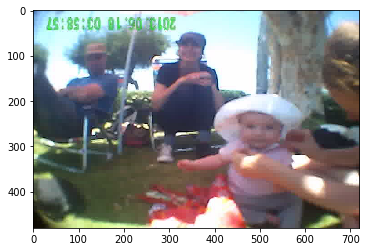

Face? (y/[n]/g[o back]) 
Recorded ''

Image 87/98


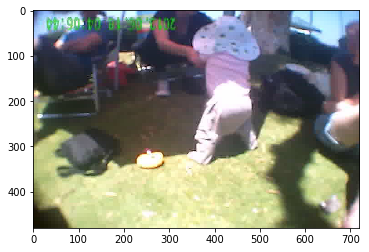

Face? (y/[n]/g[o back]) 
Recorded ''

Image 88/98


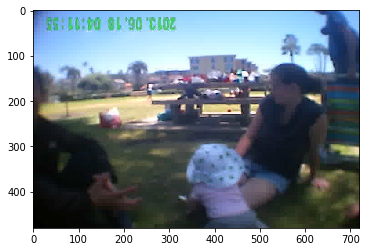

Face? (y/[n]/g[o back]) 
Recorded ''

Image 89/98


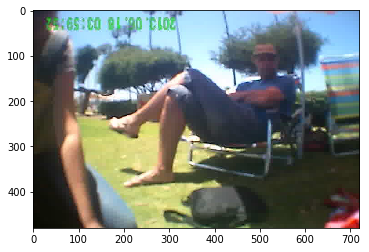

Face? (y/[n]/g[o back]) 
Recorded ''

Image 90/98


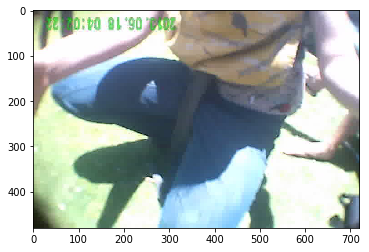

Face? (y/[n]/g[o back]) 
Recorded ''

Image 91/98


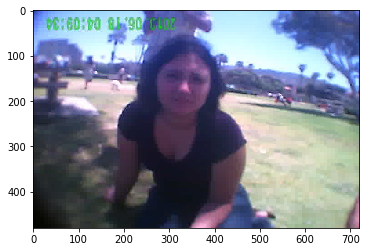

Face? (y/[n]/g[o back]) 
Recorded ''

Image 92/98


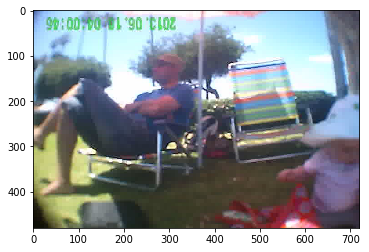

Face? (y/[n]/g[o back]) 
Recorded ''

Image 93/98


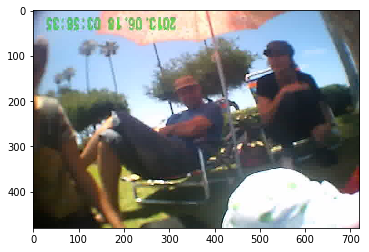

Face? (y/[n]/g[o back]) 
Recorded ''

Image 94/98


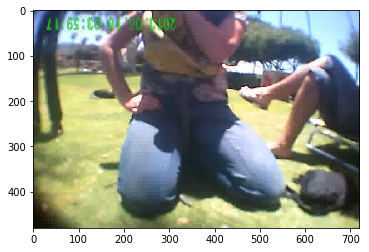

Face? (y/[n]/g[o back]) 
Recorded ''

Image 95/98


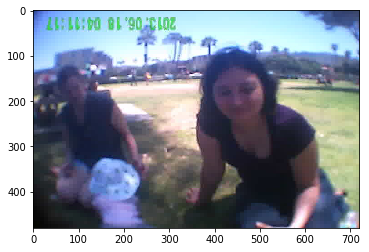

Face? (y/[n]/g[o back]) 
Recorded ''

Image 96/98


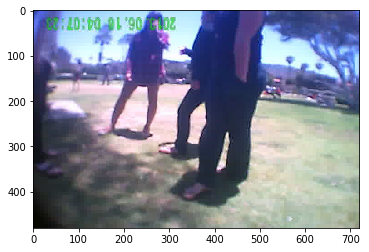

Face? (y/[n]/g[o back]) 
Recorded ''

Image 97/98


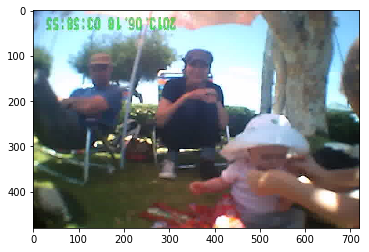

Face? (y/[n]/g[o back]) 
Recorded ''

Image 98/98


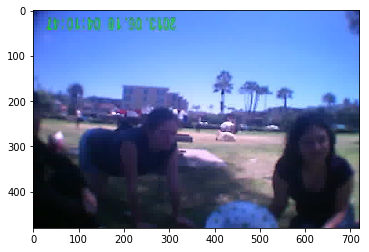

Face? (y/[n]/g[o back]) 
Recorded ''
Saving annotated df
Length of annotated df: 98


In [42]:
VID_FOLDER = '/scratch/users/agrawalk/headcam-algo/tests/output/testdir2'
CSV_PATH = '/scratch/users/agrawalk/headcam-algo/tests/output/testdir2/061713-1_face2.csv'


annotate_frames(VID_FOLDER, CSV_PATH)

In [9]:
VID_FOLDER = '/scratch/users/agrawalk/headcam-algo/tests/output/2014-01-01-part2_frames/'
if VID_FOLDER[-1] == '/':
    VID_FOLDER = VID_FOLDER[:-1]
    
VID_NAME = ntpath.basename(VID_FOLDER).split('_')[0] #the part before _frames

OUT_DIR = os.path.join(os.path.expandvars("$SCRATCH"),
                       'headcam-algo/tests/output/fscore_test/{0}_{1}2'.format(VID_NAME, 'face'))
FRAME_DIR = os.path.join(os.path.expandvars("$SCRATCH"), 
                         'headcam-algo/tests/output/{}_frames'.format(VID_NAME))
CSV_PATH = os.path.join(os.path.expandvars("$SCRATCH"), 
                       'headcam-algo/tests/output/{}_mtcnn.csv'.format(VID_NAME))

for v in (VID_FOLDER, VID_NAME, OUT_DIR, CSV_PATH):
    print(v)

/scratch/users/agrawalk/headcam-algo/tests/output/2014-01-01-part2_frames
2014-01-01-part2
/scratch/users/agrawalk/headcam-algo/tests/output/2014-01-01-part2_face2
/scratch/users/agrawalk/headcam-algo/tests/output/2014-01-01-part2_mtcnn.csv
